# Docker Results vs Pipeline Results
**Purpose:** Verify that Docker is working correctly and outputting the correct files.
## Pipeline: 

In [ ]:
import sys
sys.path.insert(0, '../code/functions/')
import plosLib as pLib
import connectLib as cLib
from cluster import Cluster
import mouseVis as mv
import tiffIO as tIO
import visualize as vis
import cPickle as pickle

def pipeline(tiffImage, visSlice=0):
    data0 = tIO.unzipChannels(tIO.loadTiff(tiffImage))[0][5:10]
    #finding the clusters after plosPipeline - list the decayed clusters
    print "Finding clusters"
    plosOut = pLib.pipeline(data0)
    bianOut = cLib.otsuVox(plosOut)
    connectList = cLib.connectedComponents(bianOut)
    #threshold decayed clusters (get rid of background)
    threshClusterList = cLib.thresholdByVolumeNaive(connectList)

    #pickle.dump(threshClusterList, open('plos.clusters', 'w'))

    #finding the clusters without plosPipeline - lists the entire clusters
    bianRawOut = cLib.binaryThreshold(data0)
    clusterRawList = cLib.connectedComponents(bianRawOut)
    clusterRawThreshList = cLib.thresholdByVolumeNaive(clusterRawList)

    #pickle.dump(clusterRawThreshList, open('raw.clusters', 'w'))

    #final clusters
    completeClusterList = cLib.clusterCoregister(threshClusterList, clusterRawThreshList)
    #pickle.dump(completeClusterList, open('complete.clusters', 'w'))
    print "Done finding clusters"
    print "Visualizing Results At z=" + str(visSlice)
    #completeClusterList = pickle.load(open('complete.clusters', 'rb'))
    #visualize
    vis.visualize(visSlice, data0, completeClusterList)


####Running pipeline
pipeline('../data/SEP-GluA1-KI_tp1.tif')


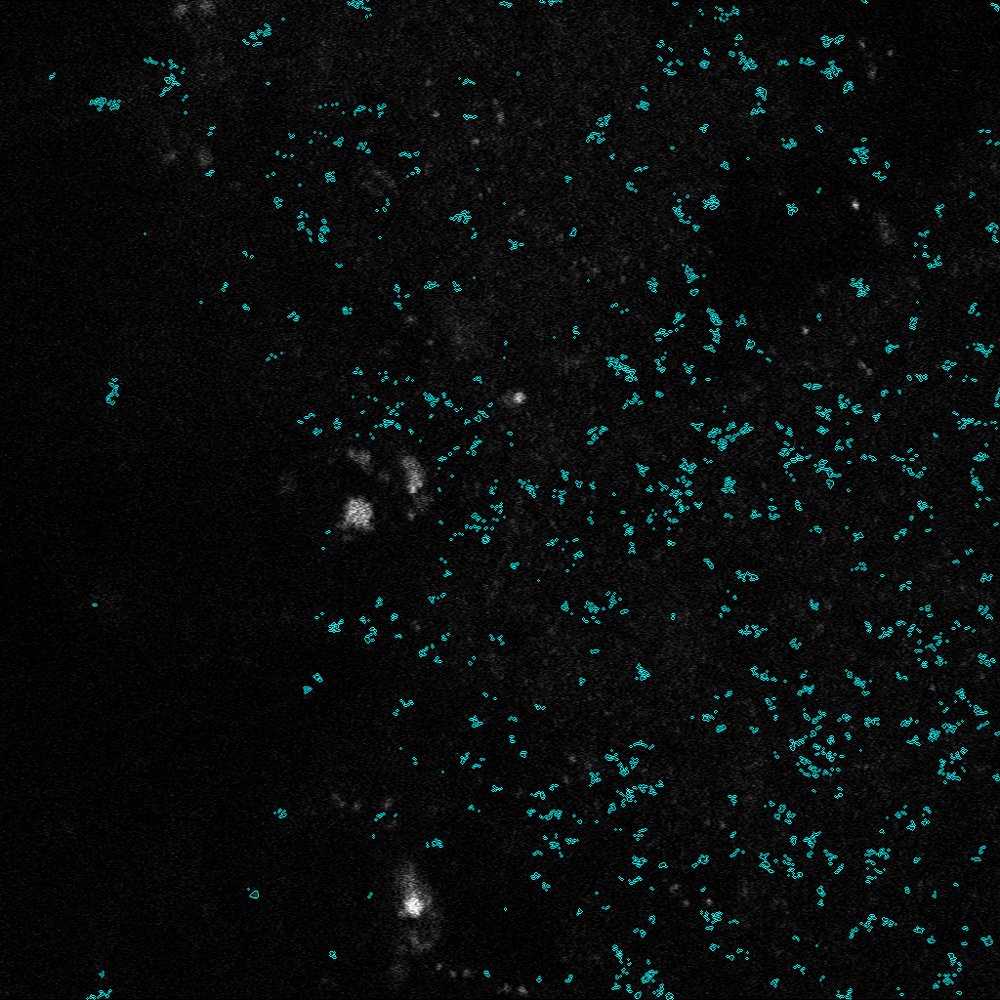

In [1]:
from IPython.display import Image
Image("PipelineResults.png")

## Docker:

In [1]:
import os
os.system("docker run -v /Users/richardguo/Neurodata/data:/data/ pansynapse python ./code/functions/runPipeline.py")

0

In [4]:
os.system("docker cp b6f0d6971487:/final.image $PWD")

0

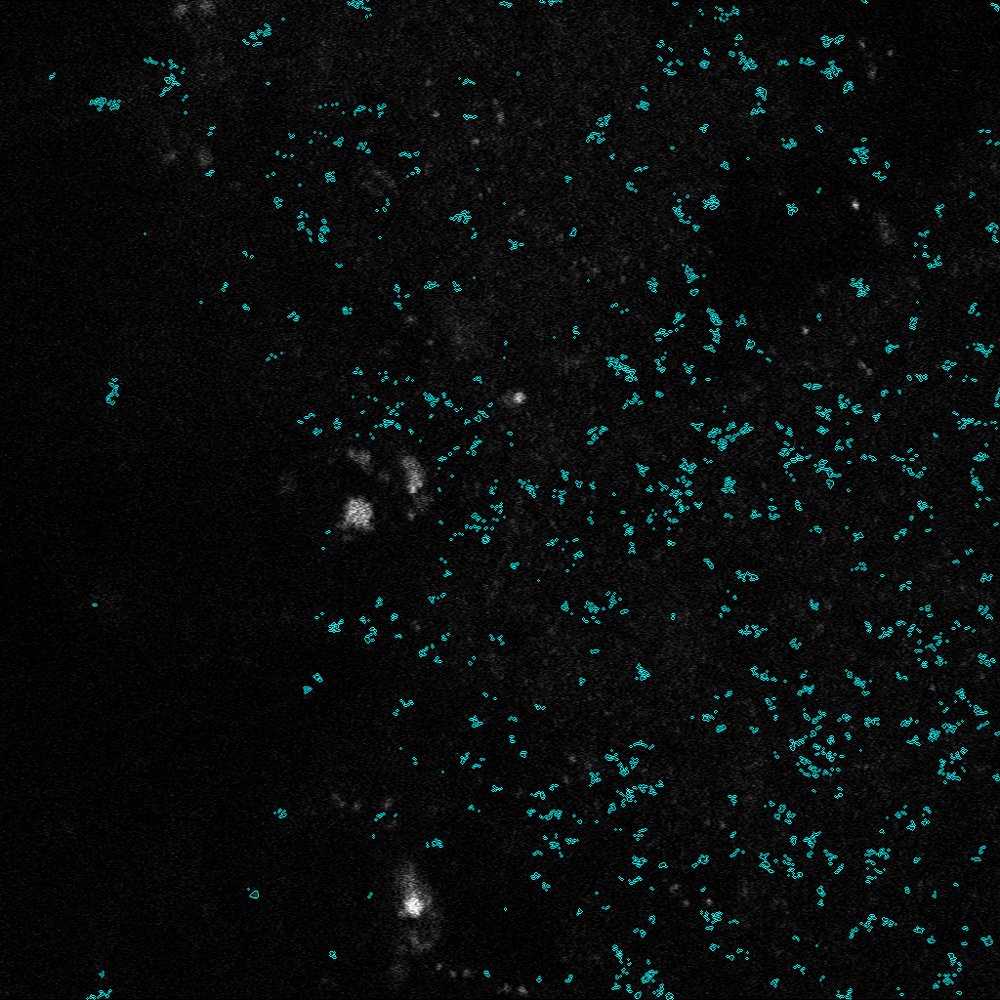

In [8]:
import cv2
import cPickle as pickle
from IPython.display import Image
 
dockerImage = pickle.load(open('final.image', 'rb'))
cv2.imshow('Image Slice from Docker', dockerImage)
cv2.imwrite('DockerResults.png', dockerImage)
Image('DockerResults.png')

In [14]:
pipelineImg = cv2.imread("PipelineResults.png")
dockerImg = cv2.imread("DockerResults.png")
if pipelineImg.all() == dockerImg.all():
    print 'True'

True
